# Deconvolution and Decomposition of Mouse Cortex Visium Data using Spotiphy
- by Ziqian Zheng <zzheng92@wisc.edu> and Jiyuan Yang <jiyuan.yang@stjude.org>.
- Last update: Mar 7th 2025

## Contents
1. [Environment Setup: Package Installation and Loading](#Install)
2. [Data Preparation: Loading and Processing](#Load-data)
3. [Deconvolution: Marker Gene Selection and scRNA Reference Construction](#Marker)
4. [Deconvolution: Cellular Proportion Estimation](#Deconvolution)
5. [Deconvolution: Cell Number Estimation Using Segmentation](#Segmentation)
6. [Decomposition: Expression Breakdown of Each Spot to Single-cell Resolution](#Decomposition)
7. [Imputation: Creation of Pseudo Single-cell resolution Image](#Pseudo_image)

## Environment Setup: Package Installation and Loading <a name="Install"></a>
If you're using you local environment, please ensure that `spotiphy` is correctly installed by following the instructions on its [GitHub page](https://github.com/jyyulab/Spotiphy).

If you're using Google Colab, please execute the following code block to install `spotiphy` and all its dependencies. To ensure the code runs smoothly in Google Colab, we will manually eliminate some unnecessary Jupyter variables.

**😮Important:** To get enough RAM, [Colab Pro](https://colab.research.google.com/signup) might be needed.

For the first time the following code block is executed in Google Colab, you may get an error of inconsistent package versions like this:

* ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.

To solve this issue, simply ignore this error and **restart the session** (Click _Runtime_, then click _Restart Session_). Then you will be able to load the packages correctly.

In [1]:
import sys
IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    !pip install -qq spotiphy

In [2]:
import spotiphy
import os
import pickle
import numpy as np
import pandas as pd
import matplotlib as mpl
import scanpy as sc
import torch
import cv2

Specify the output folder.

In [3]:
results_folder = 'Spotiphy_Result/'
if not os.path.exists(results_folder):
    # Create result folder if it does not exist
    os.makedirs(results_folder)

## Data Preparation: Loading and Processing <a name="Load-data"></a>

Check if the example datasets exist. If not, download them from GitHub.

In [4]:
import requests
if not os.path.exists('data/'):
    os.makedirs('data/')

data_path = ['data/scRNA_mouse_brain.h5ad', 'data/ST_mouse_brain.h5ad',
             'data/img_mouse_brain.png']
urls = ['https://raw.githubusercontent.com/jyyulab/Spotiphy/main/tutorials/data/scRNA_mouse_brain.h5ad',
        'https://raw.githubusercontent.com/jyyulab/Spotiphy/main/tutorials/data/ST_mouse_brain.h5ad',
        'https://raw.githubusercontent.com/jyyulab/Spotiphy/main/tutorials/data/img_mouse_brain.png']

for i, path in enumerate(data_path):
    if not os.path.exists(path):
        response = requests.get(urls[i], allow_redirects=True)
        with open(path, 'wb') as file:
            file.write(response.content)
        del response

Load the scRNA data, visium data and the corresponding H&E staining image.

In [5]:
adata_sc = sc.read_h5ad("data/scRNA_mouse_brain.h5ad")
adata_st = sc.read_h5ad("data/ST_mouse_brain.h5ad")
adata_st.var_names_make_unique()
img = cv2.imread("data/img_mouse_brain.png")

# Another option for loading Visium data is to use the following function and point the directory to the 10x Visium raw data folder.
# adata_st = sc.read_visium("data/ST_mouse_brain/outs")

`key_type` refers to the annotation of scRNA data used for reference construction.
If modifications are needed, such as merging several cell subtypes into a general cell type, use the following code:
```python
# #Define the cell types to merge and the new cell type name
# types_to_merge = ['subtype1A', 'subtype1B', 'subtype1C', 'subtype1D']
# new_type = 'Type1'
#
# #Merge the specified cell types into the new type
# adata_sc.obs['cellType'] = adata_sc.obs['cellType'].replace(types_to_merge, new_type)
```

In [6]:
key_type = 'celltype'
type_list = sorted(list(adata_sc.obs[key_type].unique().astype(str)))
print(f'There are {len(type_list)} cell types: {type_list}')

There are 14 cell types: ['Astro', 'CA', 'DG', 'L2/3 IT CTX', 'L4 IT CTX', 'L4/5 IT CTX', 'L5 IT CTX', 'L5 PT CTX', 'L5/6 IT CTX', 'L6 CT CTX', 'L6b CTX', 'Microglia', 'Oligo', 'SUB']


Convert the spatial coordinates into integer values.

In [7]:
adata_st.obsm['spatial'] = adata_st.obsm['spatial'].astype(np.int32)
# print(adata_st.obsm['spatial'])

Verify all inputs carefully before proceeding.

scatterplots.py (392): No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


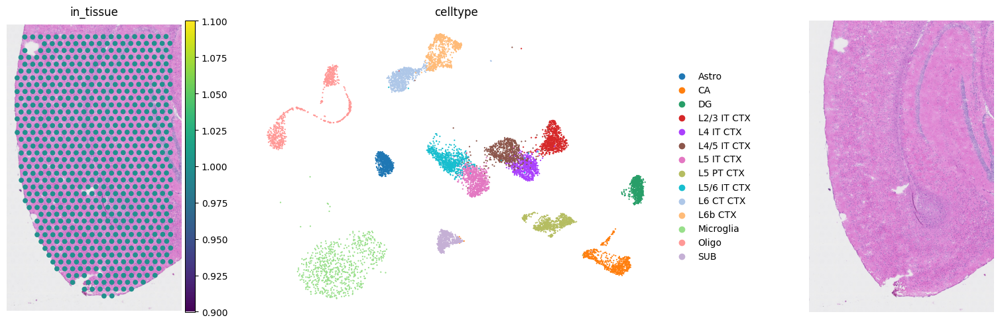

In [8]:
fig, axs = mpl.pyplot.subplots(1, 3, figsize=(20, 5))
sc.pl.spatial(adata_st, color="in_tissue", frameon=False, show=False, ax=axs[0])
sc.pl.umap(adata_sc, color= key_type, size=10, frameon=False, show=False, ax=axs[1])
axs[2].imshow(img[:, :, [2, 1, 0]])  # In default, cv2 uses BGR. So we convert BGR to RGB.
axs[2].axis('off')
mpl.pyplot.tight_layout()
mpl.pyplot.savefig(f'{results_folder}figurepath+figurename.jpg', bbox_inches='tight', dpi=400)

## Deconvolution: Marker Gene Selection and scRNA Reference Construction  <a name="Marker"></a>
Initialize the spatial transcriptomics and scRNA data. Specifically,
- `adata_sc` and `adata_st` are normalized
- cells and genes in `adata_sc` are filtered
- only the common genes shared by `adata_sc` and `adata_st` are kept

In [9]:
adata_sc, adata_st = spotiphy.initialization(adata_sc, adata_st, verbose=1)

Convert expression matrix to array: 0.65s
Normalization: 2.1s
Filtering: 2.66s
Find common genes: 0.03s


Select marker genes based on pairwise statistical tests. The selected marker genes are saved as a CSV file.

Users can adjust the following arguments:

- `n_select`: the maximum number of marker genes select for each cell type
- `threshold_p`: threshold of the $p$-value to be considered significant
- `threshold_fold`: threshold of the fold-change to be considered significant
- `q`: Since more than one $p$-values are obtained in using the pairwise tests, we only consider the $p$-value at quantile `q`. For additional details, please refer to the supplementary material of the paper.
- `return_dict`: Whether return a dictionary representing the marker genes selected for each cell type, or just return the list of all selected marker genes.

The parameters specified in the following code block provide a good starting point.

In [10]:
marker_gene_dict = spotiphy.sc_reference.marker_selection(adata_sc, key_type=key_type, return_dict=True, 
                                                          n_select=50, threshold_p=0.1, threshold_fold=1.5,
                                                          q=0.15)
marker_gene = []
marker_gene_label = []
for type_ in type_list:
    marker_gene.extend(marker_gene_dict[type_])
    marker_gene_label.extend([type_]*len(marker_gene_dict[type_]))
marker_gene_df = pd.DataFrame({'gene':marker_gene, 'label':marker_gene_label})
marker_gene_df.to_csv(results_folder+'marker_gene.csv')
# Filter scRNA and spatial matrices with marker genes
adata_sc_marker = adata_sc[:, marker_gene]
adata_st_marker = adata_st[:, marker_gene]

Construct the single-cell reference and visualize selected marker genes with heatmaps.

Adjust parameters in the previous step as needed to optimize marker gene selection:
- If several cell types are very similar (e.g., T cell subtypes), try setting `q=0.3` or adjust accordingly.
- If there are limited marker genes for each cell type, try setting `threshold_fold=1.2` or adjust as needed.

14it [00:00, 841.51it/s]


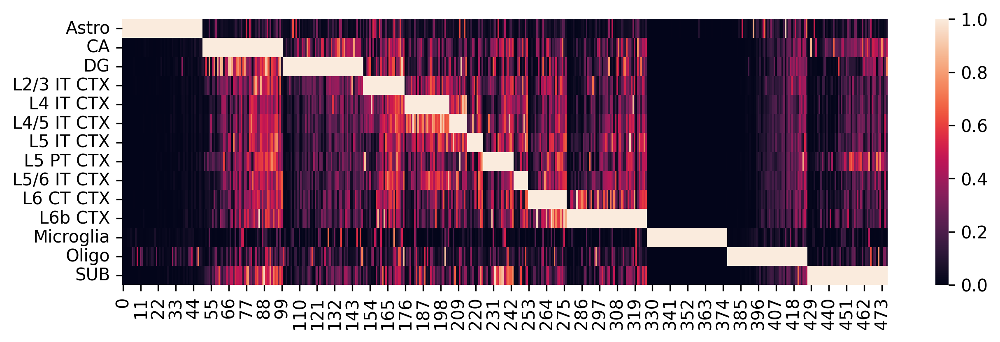

In [11]:
sc_ref = spotiphy.construct_sc_ref(adata_sc_marker, key_type=key_type)
spotiphy.sc_reference.plot_heatmap(adata_sc_marker, key_type, save=True, out_dir=results_folder)

Another option will be input your customized marker gene list. Use the following code:
```python
with open("filename.txt", 'r') as f:
    marker_gene = f.read()
marker_gene = marker_gene.split()
print(marker_gene)
adata_sc_marker = adata_sc[:, marker_gene]
adata_st_marker = adata_st[:, marker_gene]
```

## Deconvolution: Cellular Proportion Estimation <a name="Deconvolution"></a>
For performing the deconvolution, we calculate the posterior distribution of certain parameters within a probabilistic generative model using [`Pyro`](https://pyro.ai/).

Parameters of the function `estimation_proportion`:

- `X`: Spatial transcriptomics data. n_spot*n_gene.
- `adata_sc`: scRNA data (Anndata).
- `sc_ref`: Single cell reference. n_type*n_gene.
- `type_list`: List of the cell types.
- `key_type`: Column name of the cell types in adata_sc.
- `batch_prior`: Parameter involved in the prior distribution of the batch effect factors. It is recommended to select from $[1, 2]$.
- `n_epoch`: Number of training epoch.

100%|██████████| 8000/8000 [02:58<00:00, 44.81it/s]


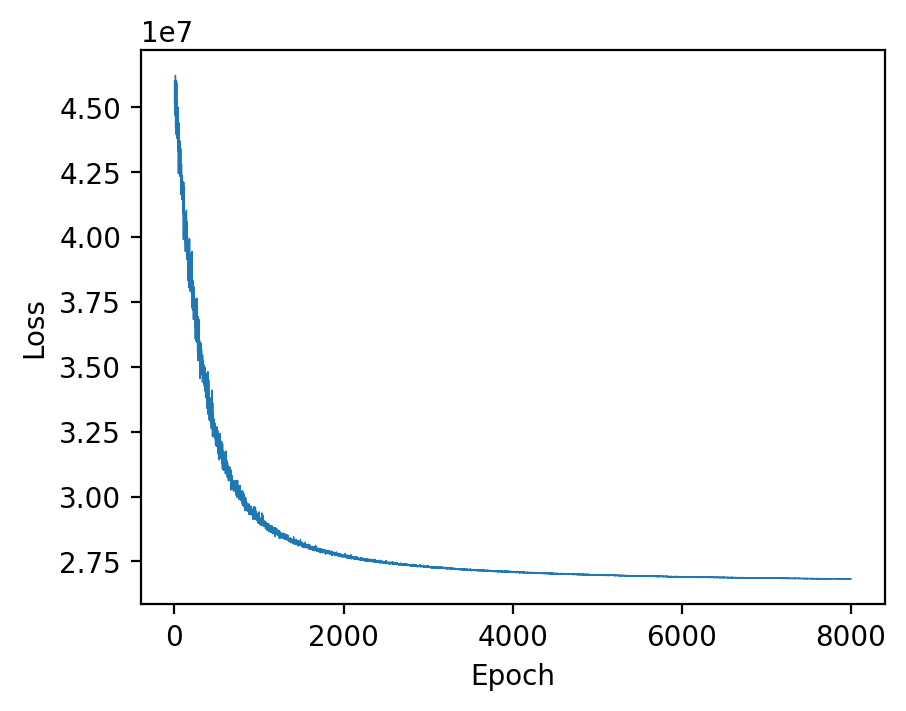

3969168415.py (5): Trying to modify attribute `.obs` of view, initializing view as actual.


In [12]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
X = np.array(adata_st_marker.X)
cell_proportion = spotiphy.deconvolution.estimation_proportion(X, adata_sc_marker, sc_ref, type_list, key_type, n_epoch=8000,
                                                               plot=True, batch_prior=1, device=device)
adata_st.obs[type_list] = cell_proportion
# Save the cellular proportions for future usage
np.save(results_folder+'proportion.npy', cell_proportion)
adata_st.obs[type_list].to_csv(f'{results_folder}proportion.csv')

Generate heatmaps of cellular proportions.

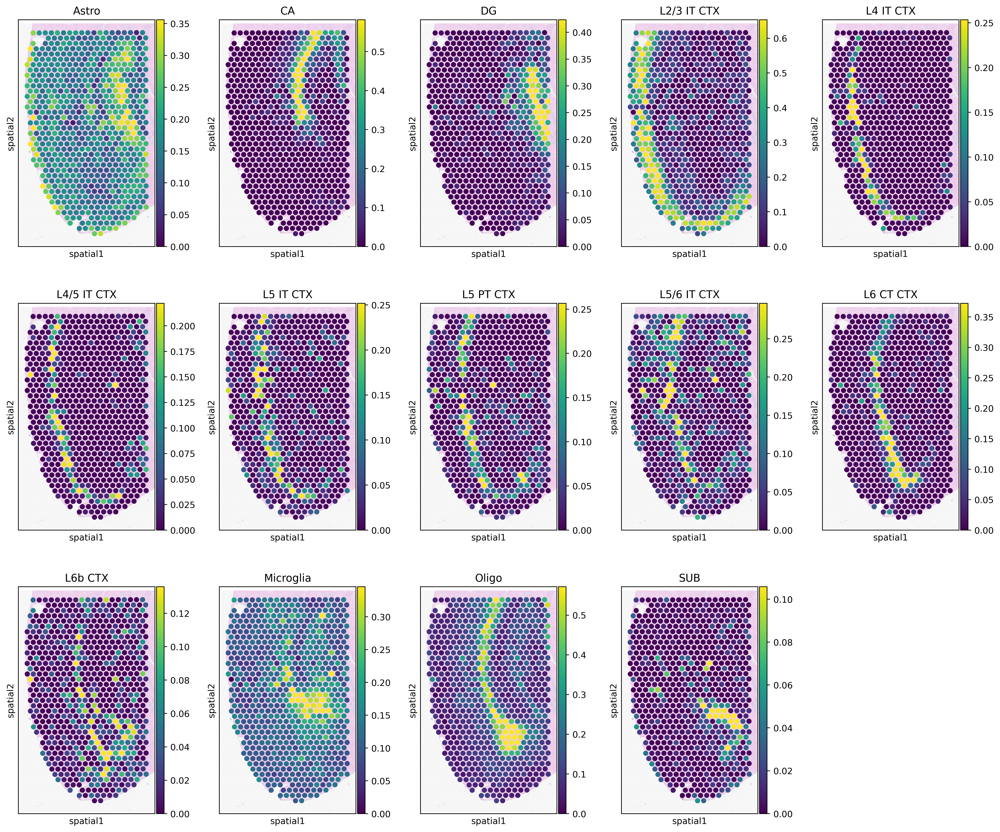

In [13]:
vmax = np.quantile(adata_st.obs[type_list].values, 0.98, axis=0)
vmax[vmax<0.05] = 0.05
with mpl.rc_context({'figure.figsize': [3, 5], 'figure.dpi': 400, 'xtick.labelsize': 0}):
    ax = sc.pl.spatial(adata_st, cmap='viridis', color=type_list, img_key='hires', vmin=0, vmax=list(vmax),
                       size=1.3, show=False, ncols=5, alpha_img=0.4)
    ax[0].get_figure().savefig(f'{results_folder}Spotiphy_deconvolution.jpg')

## Deconvolution: Cell Number Estimation Using Segmentation <a name="Segmentation"></a>
`Stardist` package is used to segment nuclei from H&E staining images, after which the number of nuclei in each spot is counted. Note that the image and segmentation step is not required if only deconvolution results are needed.

Parameters use in function `Segmentation`:

- `img` (numpy.ndarray):. Three channel stained image. In default, it should be hematoxylin and eosin (H&E) stained image.
- `spot_center`: Coordinates of the center of the spots.
- `out_dir`: Output directory.
- `Prob_thresh`, `nms_thresh`: Two thresholds used in Stardist. User should adjust these two thresholds based on the segmentation results. More details can be found [here](https://squidpy.readthedocs.io/en/stable/notebooks/tutorials/tutorial_stardist.html).
- `spot_radius`: Radius of the spots. In the example image, it should be 36.5 in pixel (55 um).
- `n_tiles`: Out of memory (OOM) errors can occur if the input image is too large. To avoid this problem, the input image is broken up into (overlapping) tiles that are processed independently and re-assembled. In default, we break the image into 8*8 tiles.
- `enhancement`: An image enhancement feature for pre-processing input images. Users can enable or disable this feature by setting the parameter to `True` or `False`. It is recommended to compare the segmentation outputs with enhancement ON and OFF. Preliminary comparisons indicate that enhanced HE images can significantly reduce the false negative rate of StarDist, allowing for the detection of more accurate nuclei.

In [14]:
if not os.path.exists(f'{results_folder}segmentation/'):
    os.makedirs(f'{results_folder}segmentation/')
Segmentation = spotiphy.segmentation.Segmentation(img[:, :, [2, 1, 0]], adata_st.obsm['spatial'], 
                                                  n_tiles=(2, 2, 1),
                                                  out_dir=f'{results_folder}segmentation/',
                                                  enhancement=True)
Segmentation.segment_nucleus(save=True)
n_cell_df = Segmentation.n_cell_df
# Save the segmentation for future usage
df = pd.DataFrame(n_cell_df)
df.to_csv(f'{results_folder}segmentation/n_cell_per_spot.csv', index=False)

Suppress the output of tensorflow prediction for tensorflow version 2.12.0>=2.9.0.
Found model '2D_versatile_he' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.


100%|██████████| 4/4 [00:03<00:00,  1.17it/s]


Plot a small section of the segmented results for examination.

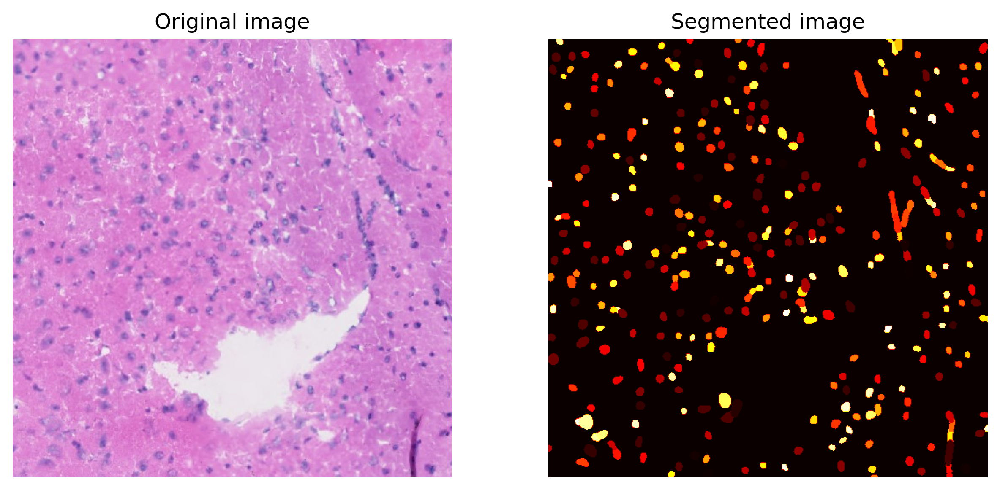

In [15]:
Segmentation.plot(save=True, crop=(2000, 2500, 1000, 1500),
                  path=f'{results_folder}segmentation/segmentation_sample.jpg')

## Decomposition: Expression Breakdown of Each Spot to Single-cell Resolution <a name="Decomposition"></a>


To decompose all genes in the spatial transcriptomics data, both scRNA-seq data and spatial transcriptomics data must be reloaded.
`n_cell` represents the number of cells in each spot, with four opinions available:

- `n_cell_df['cell_count'].values`. The default setting, which uses the number of nuclei derived from segmentation results.
- `estimate`. Estimates the number of cells based on the total counts for each spot.
- `[fixed_value] * len(adata_st_orig)`. A user defined `[fixed_value]` is applied as the cell number for all spots.
- `None`. Assumes that a cell type does not exist in a spot unless its proportion exceeds the `threshold`.

For more details, please refer to the [document](https://jyyulab.github.io/Spotiphy/deconvolution.html#deconvolution.decomposition).

In [16]:
adata_sc_orig = sc.read_h5ad("data/scRNA_mouse_brain.h5ad")
adata_st_orig = sc.read_h5ad("data/ST_mouse_brain.h5ad")
adata_st_orig.var_names_make_unique()

In [17]:
# Read in the saved segmentation results.
# n_cell_df = pd.read_csv(results_folder+'segmentation/n_cell_df.csv', header=0)
n_cell = n_cell_df['cell_count'].values
adata_st_decomposed = spotiphy.deconvolution.decomposition(adata_st_orig, adata_sc_orig, key_type,
                                                           cell_proportion, save=True,out_dir=results_folder,
                                                           verbose=1, spot_location=adata_st_orig.obsm['spatial'],
                                                           filtering_gene=True,
                                                           n_cell=n_cell,
                                                           filename='ST_decomposition.h5ad')

deconvolution.py (710): elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


Prepared proportion data. Time use 0.03
Initialized scRNA and ST data. Time use 5.66


14it [00:00, 37.82it/s]


Processed scRNA and ST data. Time use 2.52
Decomposition complete. Time use 1.58
Constructed ST decomposition data file. Time use 0.32
Saved file to output folder. Time use 3.80


## Imputation: Creation of Pseudo Single-cell resolution Image <a name="Pseudo_image"></a>
The H&E staining image only highlights nuclei, we first infer the boundary of each cell.
Specifically, the area of each cell is gradually expended outward from the center of its nucleus. The expansion stopped when one of the following conditions is met:

- The cell area exceeds `max_area`.
- The surrounding neighborhood is fully occupied by other cells.
- The maximum distance from the cell boundary to the nucleus center exceeds `max_dist`.
- `delta` represent the incremental expansion distance in each iteration.

In [18]:
search_direction = [[1, 0], [0, 1], [-1, 0], [0, -1], [2, 0], [0, 2], [-2, 0], [0, -2], 
                    [1, 1], [-1, 1], [-1, -1], [1, -1]]
boundary_dict = spotiphy.segmentation.cell_boundary(Segmentation.nucleus_df[['x', 'y']].values, 
                                                    img_size=img.shape[:2], max_dist=25, max_area=580, 
                                                    verbose=0, search_direction=search_direction, delta=2)
# Save the dictionary of the cell boundaries for future usage
with open(f'{results_folder}segmentation/boundary_dict.pkl', 'wb') as file:
    pickle.dump(boundary_dict, file)

100%|██████████| 4100/4100 [00:05<00:00, 697.62it/s] 


Assign cell types to nuclei in the spatial image through the following steps:

- Function `proportion_to_count`: Calculate the count of each cell type based on segmentation results and the estimated cellular proportions.
- Function `assign_type_spot`: Assign cell types to nuclei within the spatial spots.
- Function `cell_proportion_smooth`: Allocate cell types to nuclei located outside the spatial spots.

In [19]:
cell_number = spotiphy.deconvolution.proportion_to_count(cell_proportion, n_cell_df['cell_count'].values, 
                                                         multiple_spots=True)
Segmentation.nucleus_df = (
    spotiphy.deconvolution.assign_type_spot(Segmentation.nucleus_df, Segmentation.n_cell_df, 
                                            cell_number, type_list))
Segmentation.nucleus_df, cell_proportion_smooth = (
    spotiphy.deconvolution.assign_type_out(Segmentation.nucleus_df, cell_proportion, 
                                           Segmentation.spot_center, type_list, band_width=150))

Define the class `plot_visium` to generate the pseudo image.
Plot the image legend.

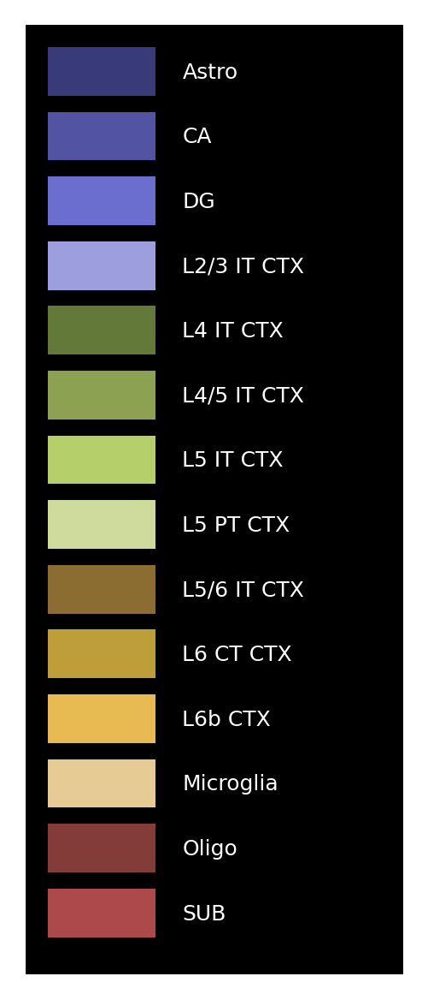

In [20]:
plot_visium = spotiphy.plot.Plot_Visium(segmentation=Segmentation, boundary_dict=boundary_dict, 
                                        type_list=type_list)
plot_visium.plot_legend(save=f'{results_folder}legend.png')

Generate the pseudo image by specifying the following arguments:

- `shape`: Defines the shape used for cells in the image. Opinions include `cell`, `nucleus`, or `circle`.
- `cell`: Indicates which group of cells to include in the image. Choose from `in`, `out`, or `both`.
- `boundary`: Indicates which group of boundaries to include in the image. Choose from `in`, `out`, `both` or `None`.

For example, to generate a pseudo image containing only cells inside the spatial spots, use the following settings.

In [21]:
# To generate a pseudo image containing only cells inside the spatial spots, use the following settings.
plot_visium.plot(background=False, save=f'{results_folder}pseudo_image_in.png', spot_color=(200, 200, 200),
                 shape='cell', cell='in', boundary='in', dpi=200)

Adding cells.


100%|██████████| 4100/4100 [00:06<00:00, 611.14it/s] 
14it [00:00, 34.23it/s]
100%|██████████| 10747/10747 [00:00<00:00, 343055.99it/s]


Adding spots.
Saving the image.


In [22]:
# To display all cells as circles without the cell boundaries, use the following settings.
plot_visium.plot(background=False, save=f'{results_folder}pseudo_image_both_circle.png',
                 spot_color=(200, 200, 200), shape='circle', cell='both', boundary=None,
                 dpi=200)

Adding cells.


10747it [00:00, 180755.18it/s]
100%|██████████| 10747/10747 [00:00<?, ?it/s]

Adding spots.
Saving the image.


The updated class `Segmentation` can be saved for future usage.

In [23]:
with open(results_folder+f'segmentation/Segmentation.pkl', 'wb') as file:
    pickle.dump(Segmentation, file)